<a href="https://colab.research.google.com/github/devarti19/Vehicle-License-Plate-Detection/blob/main/CNN_Autoencoder_and_VGG16_combined.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The dataset of car license plates contains 433 images with bounding box annotations of the number plates within the image. The goal of this project is to train a convolutional neural network capable of locating licenses plate on new images, reading the number on the plate and detecting the license plate on videos.

In [1]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [2]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 31 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 1s (5,462 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [3]:
# importing essential libraries
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
import numpy as np 
import pandas as pd
import os
from time import perf_counter
import cv2
import tensorflow as tf


%matplotlib inline

import seaborn as sns
import glob
import tensorflow as tf
from PIL import Image
import pytesseract
from sklearn.model_selection import train_test_split
from sklearn import metrics
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.applications.vgg16 import VGG16

In [4]:
image_path = '/content/gdrive/MyDrive/ML2 Project data/images-20210419T233159Z-001/images'
annotation_path = '/content/gdrive/MyDrive/ML2 Project data/annotations-20210419T233156Z-001/annotations'

In [5]:
dataFrame = {
    'image' : [],
    'box'   : [],
}

In [6]:
# A composite function for loading and drawing box
# around license plate 
def Reader(path, annotPath, size = 256, isPlot = False, showTime = False):
    
    start = perf_counter()
    img = plt.imread(path)
    img =  np.array (img[:, :, 0:3])
    
    if isPlot:
        plt.subplot(1, 2, 1)
        plt.imshow(img)
   
    # parsing html
    with open(annotPath, 'r') as f: 
        data = f.read() 
    
    Bs = BeautifulSoup(data, "xml")
    xMax = int (Bs.find('xmax').text)
    xMin = int (Bs.find('xmin').text)
    yMax = int (Bs.find('ymax').text)
    yMin = int (Bs.find('ymin').text)
    #print(xMin, xMax, yMin, yMax, img.shape)
    # storing data
    dataFrame['image'].append  ( cv2.resize(img, (size, size)))
    # drawing box
    #imgBoxed = cv2.rectangle(img, (xMin, yMin), (xMax, yMax), (0 ,255, 0), 2)
    # storing data into frame
    x = yMin
    while x < yMax:
        y = xMin
        while y < xMax:
            img[x, y, 1] = 1
            y += 1
        x += 1
        
    dataFrame['box'].append (cv2.resize(img, (size, size)))
    
    if isPlot:
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.resize(imgBoxed, (size,size)))
    
    if showTime:
        return perf_counter() - start

In [7]:
# defining Iterator
def Iterator(imageDir, annotDir):
    start = perf_counter()
    imageNames = os.listdir(imageDir)
    
    for mem in imageNames:
        path = imageDir + '/' + mem
        annotPath = annotDir + '/' + mem.split('.')[0] + '.xml'
        Reader(path, annotPath)
       
    return perf_counter() - start

In [8]:
Iterator(image_path ,annotation_path)

240.246401407

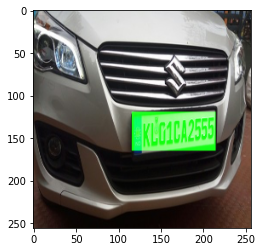

In [9]:
plt.imshow(dataFrame['box'][1])

In [10]:
# defining autoencoder model
def Conv2dBlock(inputTensor, numFilters, kernelSize = 3, doBatchNorm = True):
    #first Conv
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (inputTensor)
    
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
        
    x =tf.keras.layers.Activation('relu')(x)
    
    #Second Conv
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (x)
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
        
    x = tf.keras.layers.Activation('relu')(x)
    
    return x


# Now defining Unet 
def GiveMeUnet(inputImage, numFilters = 16, droupouts = 0.1, doBatchNorm = True):
    # defining encoder Path
    c1 = Conv2dBlock(inputImage, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)
    p1 = tf.keras.layers.Dropout(droupouts)(p1)
    
    c2 = Conv2dBlock(p1, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)
    p2 = tf.keras.layers.Dropout(droupouts)(p2)
    
    c3 = Conv2dBlock(p2, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)
    p3 = tf.keras.layers.Dropout(droupouts)(p3)
    
    c4 = Conv2dBlock(p3, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)
    p4 = tf.keras.layers.Dropout(droupouts)(p4)
    
    c5 = Conv2dBlock(p4, numFilters * 16, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    # defining decoder path
    u6 = tf.keras.layers.Conv2DTranspose(numFilters*8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    u6 = tf.keras.layers.Dropout(droupouts)(u6)
    c6 = Conv2dBlock(u6, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u7 = tf.keras.layers.Conv2DTranspose(numFilters*4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    
    u7 = tf.keras.layers.concatenate([u7, c3])
    u7 = tf.keras.layers.Dropout(droupouts)(u7)
    c7 = Conv2dBlock(u7, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u8 = tf.keras.layers.Conv2DTranspose(numFilters*2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    u8 = tf.keras.layers.Dropout(droupouts)(u8)
    c8 = Conv2dBlock(u8, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u9 = tf.keras.layers.Conv2DTranspose(numFilters*1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    u9 = tf.keras.layers.Dropout(droupouts)(u9)
    c9 = Conv2dBlock(u9, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    output = tf.keras.layers.Conv2D(3, (1, 1), activation = 'sigmoid')(c9)
    model = tf.keras.Model(inputs = [inputImage], outputs = [output])
    return model

In [11]:
## instanctiating model
inputs = tf.keras.layers.Input((256, 256, 3))
myTransformer = GiveMeUnet(inputs, droupouts= 0.07)
myTransformer.compile(optimizer = 'Adam', loss = 'binary_crossentropy', metrics = ['accuracy'] )

In [12]:
retVal = myTransformer.fit(np.array(dataFrame['image']), np.array(dataFrame['box']), epochs = 50, verbose = 1)

Epoch 1/50
14/14 [==============================] - 45s 547ms/step - loss: 0.7009 - accuracy: 0.3831
Epoch 2/50
14/14 [==============================] - 5s 350ms/step - loss: 0.5953 - accuracy: 0.4197
Epoch 3/50
14/14 [==============================] - 5s 352ms/step - loss: 0.5778 - accuracy: 0.4250
Epoch 4/50
14/14 [==============================] - 5s 349ms/step - loss: 0.5594 - accuracy: 0.4143
Epoch 5/50
14/14 [==============================] - 5s 354ms/step - loss: 0.5558 - accuracy: 0.4519
Epoch 6/50
14/14 [==============================] - 5s 356ms/step - loss: 0.5402 - accuracy: 0.4844
Epoch 7/50
14/14 [==============================] - 5s 353ms/step - loss: 0.5339 - accuracy: 0.5236
Epoch 8/50
14/14 [==============================] - 5s 357ms/step - loss: 0.5201 - accuracy: 0.5391
Epoch 9/50
14/14 [==============================] - 5s 357ms/step - loss: 0.5175 - accuracy: 0.5690
Epoch 10/50
14/14 [==============================] - 5s 357ms/step - loss: 0.5094 - accuracy: 0.581

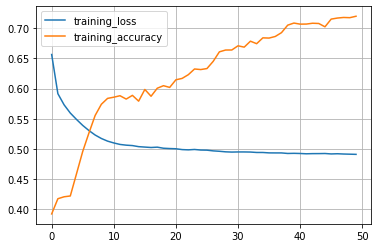

In [13]:
plt.plot(retVal.history['loss'], label = 'training_loss')
plt.plot(retVal.history['accuracy'], label = 'training_accuracy')
plt.legend()
plt.grid(True)

In [14]:
## function for getting 16 predictions
def predict16 (valMap, model, shape = 256):
    ## getting and proccessing val data
    img = valMap['image']
    mask = valMap['box']
    mask = mask[0:16]
    
    imgProc = img [0:16]
    imgProc = np.array(img)
    
    predictions = model.predict(imgProc)
    for i in range(len(predictions)):
        predictions[i] = cv2.merge((predictions[i,:,:,0],predictions[i,:,:,1],predictions[i,:,:,2]))
    
    return predictions, imgProc, mask


def Plotter(img, predMask, groundTruth):
    plt.figure(figsize=(20,10))
    
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('original Image')
    
    ## Adding Image sharpening step here
    ## it is a sharpening filter
    filter = np.array([[-1, -1, -1], [-1, 8.99, -1], [-1, -1, -1]]) 
    imgSharpen = cv2.filter2D(predMask,-1,filter)
    
    plt.subplot(1,3,2)
    plt.imshow(imgSharpen)
    plt.title('Predicted Box position')
    
    plt.subplot(1,3,3)
    plt.imshow(groundTruth)
    plt.title('actual box Position')

In [15]:
sixteenPrediction, actuals, masks = predict16(dataFrame, myTransformer)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


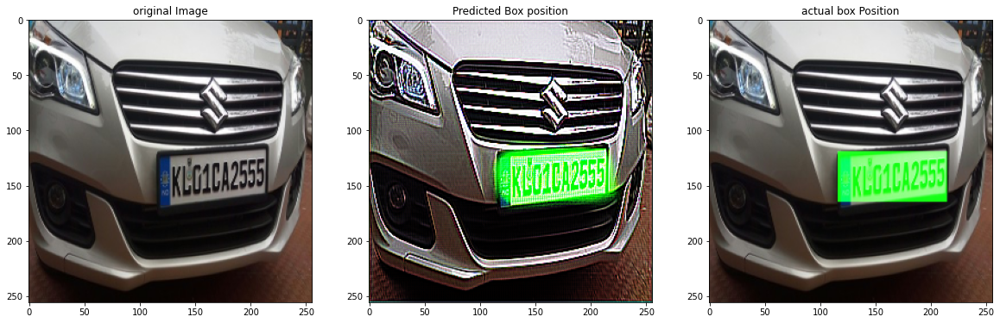

In [16]:
Plotter(actuals[1], sixteenPrediction[1], masks[1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


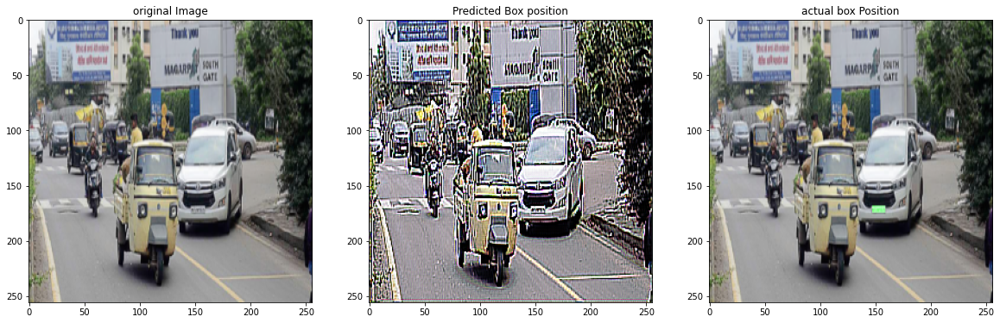

In [17]:
Plotter(actuals[3], sixteenPrediction[3], masks[3])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


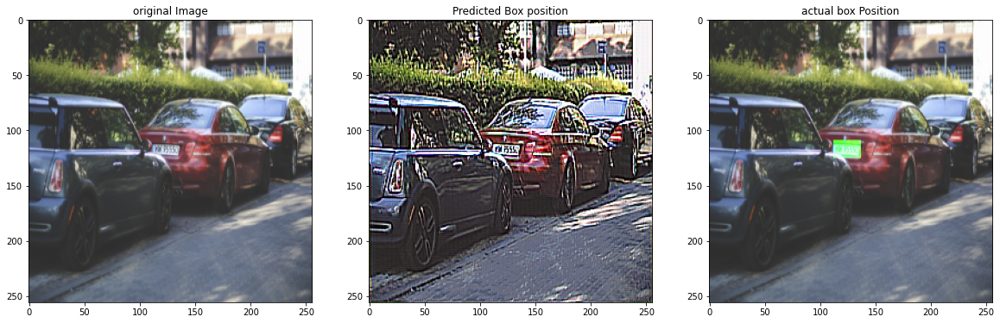

In [18]:
Plotter(actuals[2], sixteenPrediction[2], masks[2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


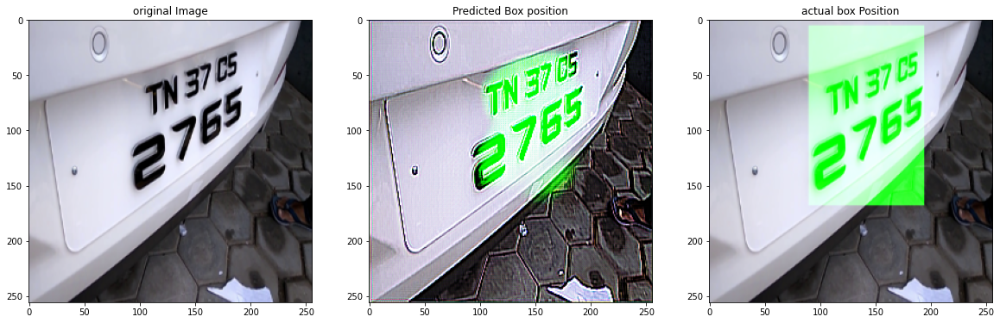

In [19]:
Plotter(actuals[4], sixteenPrediction[4], masks[4])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


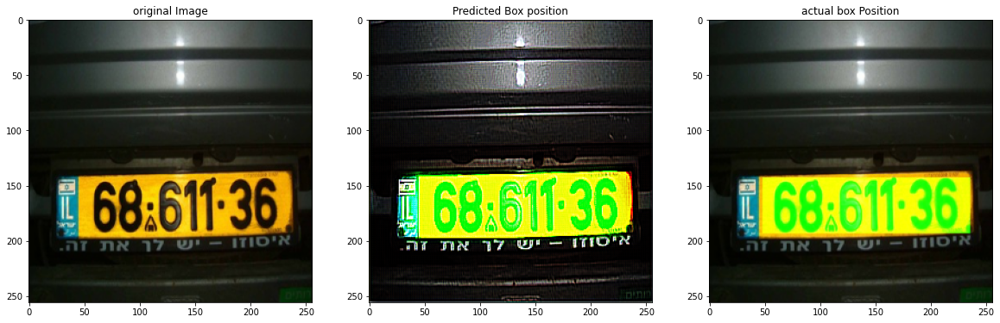

In [20]:
Plotter(actuals[5], sixteenPrediction[5], masks[5])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


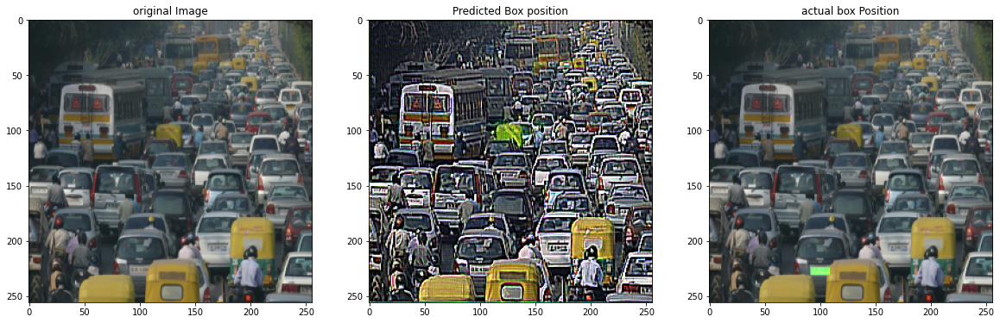

In [21]:
Plotter(actuals[7], sixteenPrediction[7], masks[7])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


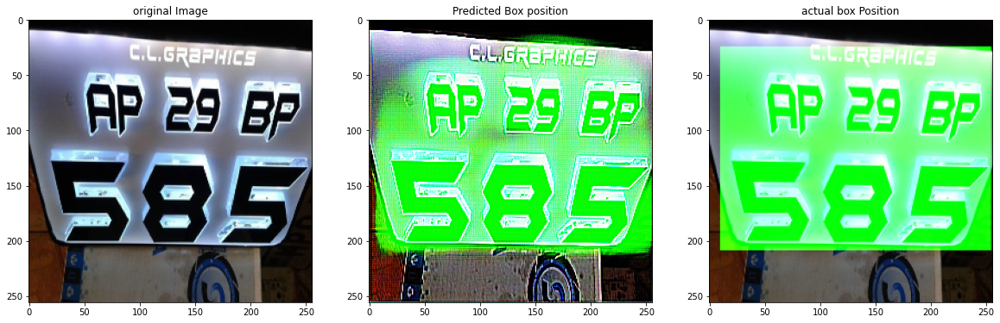

In [22]:
Plotter(actuals[8], sixteenPrediction[8], masks[8])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


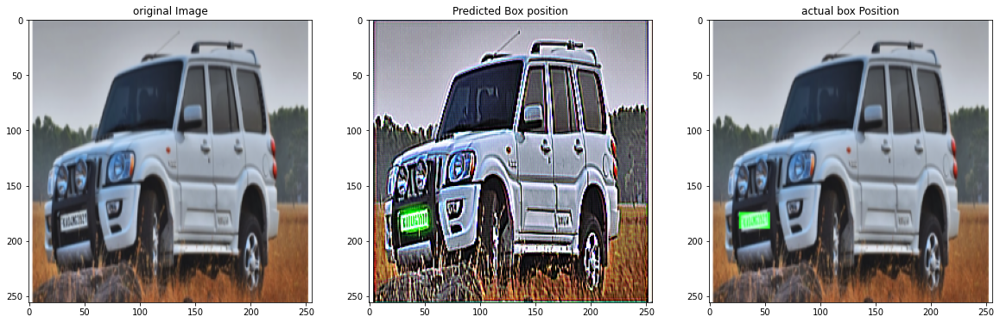

In [23]:
Plotter(actuals[9], sixteenPrediction[9], masks[9])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


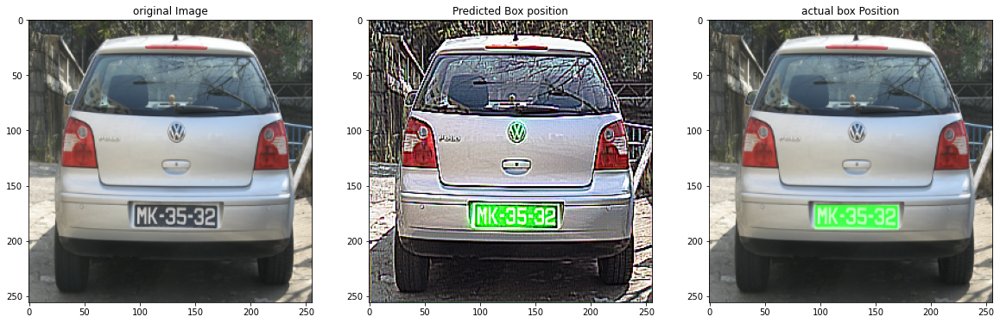

In [24]:
Plotter(actuals[11], sixteenPrediction[11], masks[11])

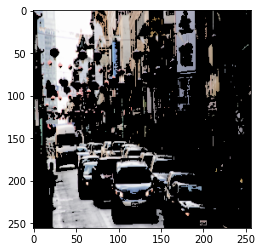

In [25]:
test = sixteenPrediction[12][:,:,1]
test [test >= 0.5] = 1
test[test != 1] = 0
test = cv2.merge((test,test,test))
plt.imshow(test*actuals[12], cmap = 'gray')

In [26]:
myTransformer.save('BetterDetector.h5')

# **Trying VGG16 on the same dataset**

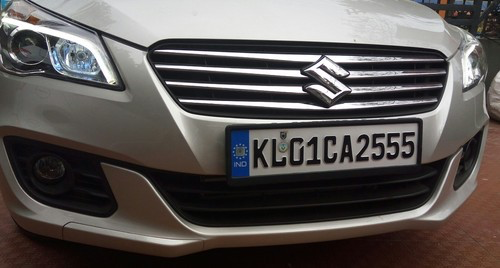

In [27]:
images = os.listdir(image_path)
images.sort()
annotations = os.listdir(annotation_path)
annotations.sort()
Image.open(os.path.join(image_path,images[0]))

In [28]:
X=[]
image_size = 224
for f in images:
    img = cv2.imread(os.path.join(image_path,f))
    img = cv2.resize(img, (image_size,image_size))
    X.append(np.array(img))

In [29]:
#Scraping XML file for getting the boundary for license plate
def resize_annotation(file):
    with open(file, 'r') as f:
        data = f.read()
    
    Bs_data = BeautifulSoup(data, "xml")
    
    width = int(Bs_data.find('width').text)
    height = int(Bs_data.find('height').text)
    xmin = int(Bs_data.find('xmin').text)
    ymin = int(Bs_data.find('ymin').text)
    xmax = int(Bs_data.find('xmax').text)
    ymax = int(Bs_data.find('ymax').text)
    
    #below will resize the bounding boxes equivalent to (changes made in image)/image resize.
    xmin = xmin/(width/image_size)
    ymin = ymin/(height/image_size)
    xmax = xmax/(width/image_size)
    ymax = ymax/(height/image_size)
        
    return [int(xmax), int(ymax), int(xmin), int(ymin)]

In [30]:
print(resize_annotation(os.path.join(annotation_path,annotations[0])))

[187, 144, 101, 104]


In [31]:
y=[]
for f in annotations:
    y.append(resize_annotation(os.path.join(annotation_path,f)))

In [32]:
#checking shape of the arrays ,both must have same length
print(np.array(X).shape,np.array(y).shape)

(433, 224, 224, 3) (433, 4)


The first 6 images of the dataset are shown below :

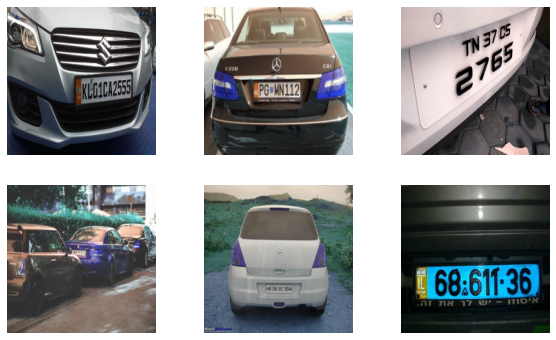

In [33]:
plt.figure(figsize=(10,6))
for i in range(0,6) :
    plt.subplot(2,3,i+1)
    plt.axis('off')
    plt.imshow(X[i])

Original image with Boundary ->


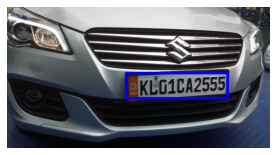

Cropped image ->


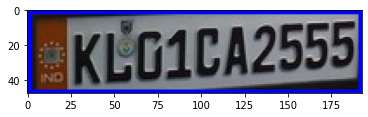

Reading image ->
KEG1CA2555

Original image with Boundary ->


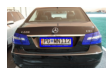

Cropped image ->


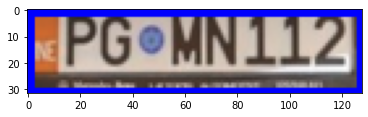

Reading image ->

Original image with Boundary ->


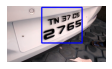

Cropped image ->


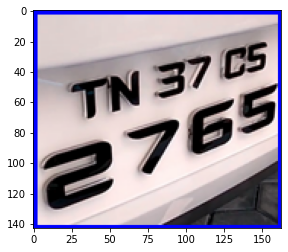

Reading image ->
57 Ee"

Original image with Boundary ->


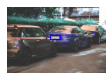

Cropped image ->


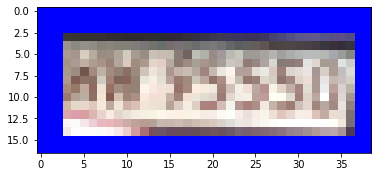

Reading image ->

Original image with Boundary ->


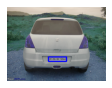

Cropped image ->


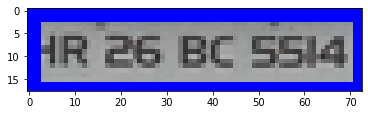

Reading image ->
(A 26 BC S5I4|

Original image with Boundary ->


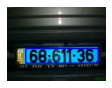

Cropped image ->


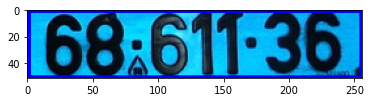

Reading image ->
168-611 36 |



In [34]:
# plotting original images with bounding boxes for just visualization
from matplotlib import pyplot as plt
plt.figure(figsize=(16,10))
for i in range(0,6) :
    img = cv2.imread(os.path.join(image_path,images[i]))
    
    with open(os.path.join(annotation_path,annotations[i]), 'r') as f:
        data = f.read()

    Bs_data = BeautifulSoup(data, "xml")

    xmin = int(Bs_data.find('xmin').text)
    ymin = int(Bs_data.find('ymin').text)
    xmax = int(Bs_data.find('xmax').text)
    ymax = int(Bs_data.find('ymax').text)

    image = cv2.rectangle(img,(xmin,ymax),(xmax,ymin),(0, 0, 255),thickness = 3)

    plt.subplot(2,3,i+1)
    plt.axis('off')
    print("Original image with Boundary ->")
    plt.imshow(image)
    plt.show()

    #Crop the image
    im2 = image.copy()
    im2_crop = im2[ymin:ymax, xmin:xmax]
    print("Cropped image ->")
    plt.imshow(im2_crop)
    plt.show()

    #Preprocessing of image
    #Converting to grayscale
    gray = cv2.cvtColor(im2_crop, cv2.COLOR_BGR2GRAY) 
    #perform thresholding
    ret,thresh1 = cv2.threshold(np.array(gray), 125, 255, cv2.THRESH_BINARY)
    #Applying tesseract
    custom_config = r'--oem 3 --psm 6'
    #config = ('-l eng --oem 1 --psm 3')
    print("Reading image ->")
    string_num = pytesseract.image_to_string(thresh1, config=custom_config)
    if(len(string_num) == 0):
        print("Can not read image")
    else:
        print(string_num)
        

Preparing the data for the Deep Learning Model :

In [35]:
#Transforming in array
X=np.array(X)
y=np.array(y)
type(X),type(y),X.dtype,y.dtype

(numpy.ndarray, numpy.ndarray, dtype('uint8'), dtype('int64'))

In [36]:
#Normalisation
X = X / 255
y = y / 255

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=1)

In [38]:
# Create the model
# using pretrained model(VGG16)
model = Sequential()
model.add(VGG16(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

# Freezing last layer of the vggnet
model.layers[-6].trainable = False

model.summary()

58892288/58889256 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               3211392   
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 4)                 260       
Total params: 17,951,108
Trainable params: 3,236,420
Non-

In [39]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [40]:
train = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, batch_size=32, verbose=1)

Epoch 1/50
10/10 [==============================] - 15s 848ms/step - loss: 0.0539 - accuracy: 0.4178 - val_loss: 0.0157 - val_accuracy: 0.4857
Epoch 2/50
10/10 [==============================] - 1s 149ms/step - loss: 0.0144 - accuracy: 0.6477 - val_loss: 0.0123 - val_accuracy: 0.6286
Epoch 3/50
10/10 [==============================] - 1s 148ms/step - loss: 0.0067 - accuracy: 0.8019 - val_loss: 0.0116 - val_accuracy: 0.5714
Epoch 4/50
10/10 [==============================] - 1s 148ms/step - loss: 0.0056 - accuracy: 0.6417 - val_loss: 0.0102 - val_accuracy: 0.7714
Epoch 5/50
10/10 [==============================] - 1s 148ms/step - loss: 0.0036 - accuracy: 0.7775 - val_loss: 0.0110 - val_accuracy: 0.7429
Epoch 6/50
10/10 [==============================] - 1s 148ms/step - loss: 0.0030 - accuracy: 0.8604 - val_loss: 0.0092 - val_accuracy: 0.7429
Epoch 7/50
10/10 [==============================] - 1s 150ms/step - loss: 0.0015 - accuracy: 0.9114 - val_loss: 0.0097 - val_accuracy: 0.8571
Epoch

In [41]:
#Saving the model
model.save('my_model.h5', overwrite=True) 

#Evaluating the model
scores = model.evaluate(X_test,y_test, verbose=0)
print("Score : %.2f%%" % (scores[1]*100))

Score : 86.21%


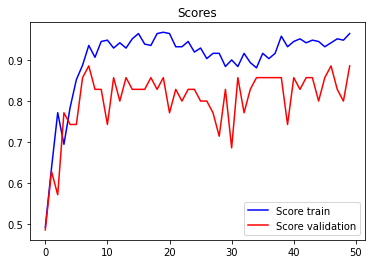

In [42]:
def plot_scores(train) :
    accuracy = train.history['accuracy']
    val_accuracy = train.history['val_accuracy']
    epochs = range(len(accuracy))
    plt.plot(epochs, accuracy, 'b', label='Score train')
    plt.plot(epochs, val_accuracy, 'r', label='Score validation')
    plt.title('Scores')
    plt.legend()
    plt.show()

plot_scores(train)

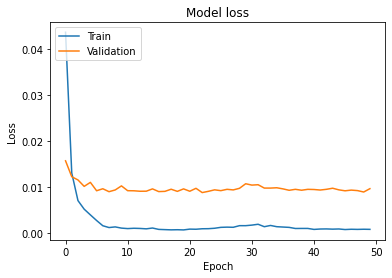

In [43]:
def plot_loss(train):
    plt.plot(train.history['loss'])
    plt.plot(train.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

plot_loss(train)

In [44]:
test_loss, test_accuracy = model.evaluate(X_test, y_test,steps=int(100))
print("Test results \n Loss:",test_loss,'\n Accuracy',test_accuracy)

100/100 [==============================] - 2s 8ms/step - loss: 0.0062 - accuracy: 0.8621
Test results 
 Loss: 0.006160703953355551 
 Accuracy 0.8620689511299133


In [45]:
y_pred = model.predict(X_test)

In [46]:
metrics.mean_absolute_error(y_pred,y_test)

0.04913385866987752

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


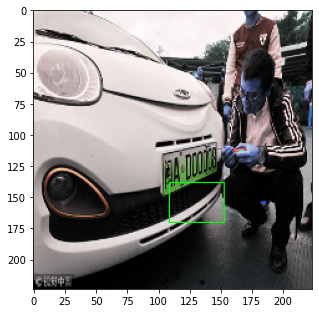

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


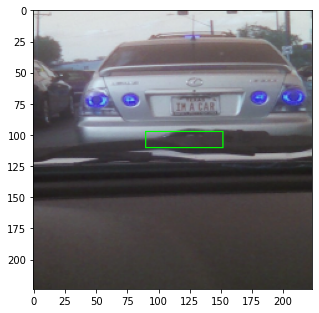

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


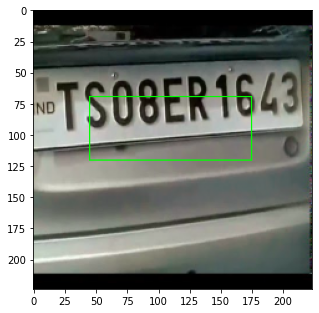

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


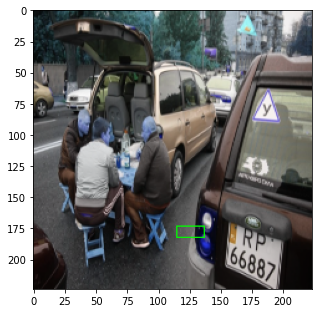

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


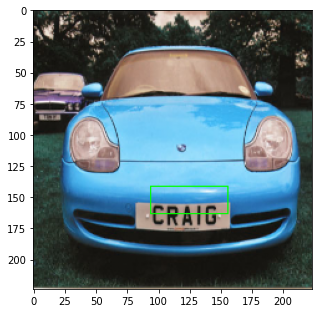

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


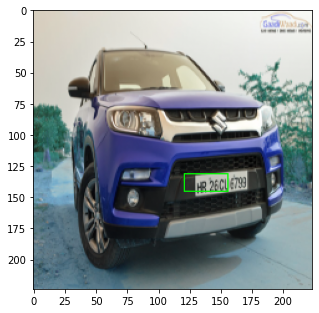

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


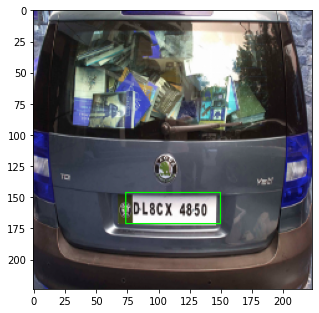

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


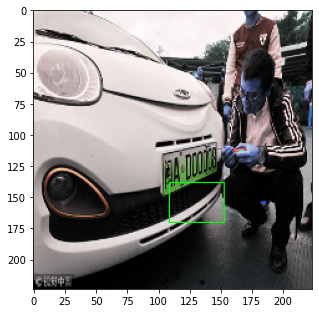

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


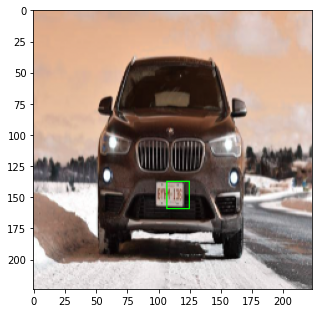

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


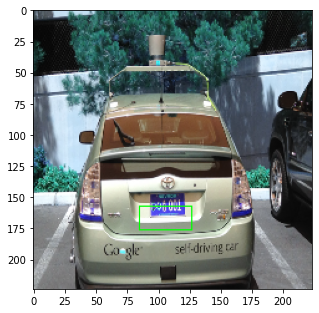

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


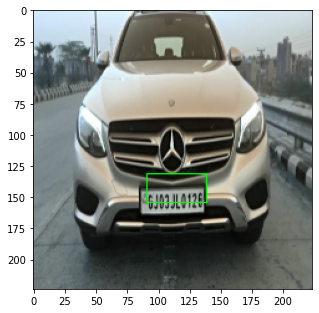

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


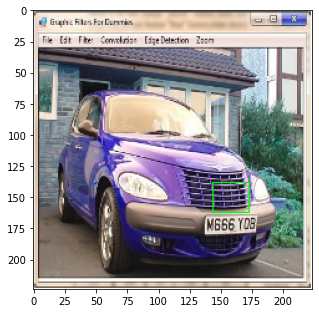

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


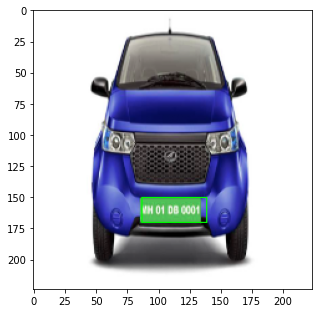

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


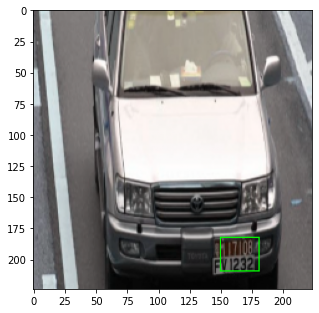

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


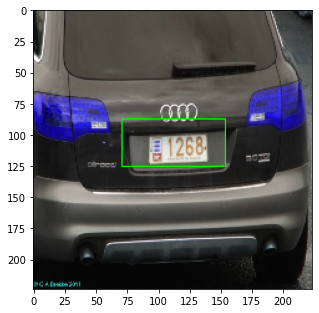

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


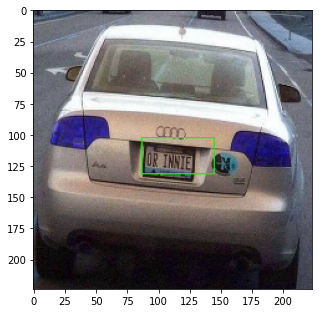

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


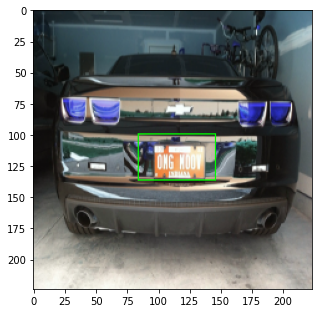

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


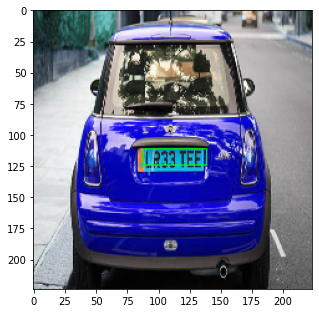

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


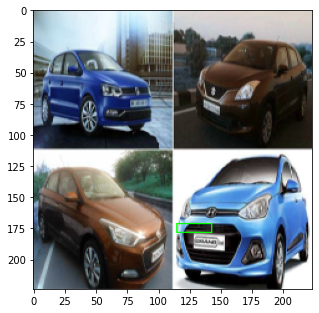

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


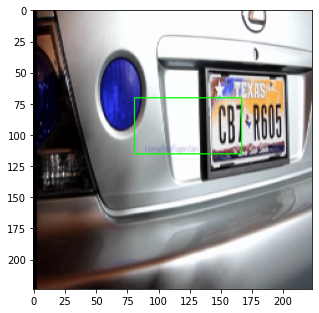

In [47]:
for i in range(0,20) :
    plt.figure(figsize=(5,10))
    ny = y_pred[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)
    plt.show()
    #print(int(ny[0]),int(ny[1]),int(ny[2]),int(ny[3]))
    
    '''#Crop the image
    im2 = image.copy()
    im2_crop = im2[int(ny[2]):int(ny[3]), int(ny[0]):int(ny[1])]
    print("Cropped image ->")
    plt.imshow(im2_crop)
    plt.show()

    #Preprocessing of image
    #Converting to grayscale
    gray = cv2.cvtColor(im2_crop, cv2.COLOR_BGR2GRAY) 
    #perform thresholding
    ret,thresh1 = cv2.threshold(np.array(gray), 125, 255, cv2.THRESH_BINARY)
    #Applying tesseract
    custom_config = r'--oem 3 --psm 6'
    #config = ('-l eng --oem 1 --psm 3')
    print("Reading image ->")
    string_num = pytesseract.image_to_string(thresh1, config=custom_config)
    if(len(string_num) == 0):
        print("Can not read image")
    else:
        print(string_num)'''